In [1]:
using Revise
using Bilevel

using RigidBodyDynamics
using MeshCatMechanisms
using MeshCat
using ForwardDiff
using Plots
using BenchmarkTools
using LinearAlgebra
using StaticArrays

┌ Info: Precompiling Bilevel [9688c538-179f-11e9-3174-495cea6b7f67]
└ @ Base loading.jl:1187


HTML{String}("    <script class='js-collapse-script'>\n        var curMatch =\n            window.location.href\n            .match(/(.*?)\\/notebooks\\/.*\\.ipynb/);\n\n        curMatch = curMatch ||\n            window.location.href\n            .match(/(.*?)\\/apps\\/.*\\.ipynb/);\n\n        if ( curMatch ) {\n            \$('head').append('<base href=\"' + curMatch[1] + '/\">');\n        }\n    </script>\n")

HTML{String}("<script class='js-collapse-script' src='/assetserver/ac453cbe1838fe7a6d3794b312bfa72db072de98-assets/webio/dist/bundle.js'></script>")

HTML{String}("<script class='js-collapse-script' src='/assetserver/ac453cbe1838fe7a6d3794b312bfa72db072de98-assets/providers/ijulia_setup.js'></script>")

HTML{String}("  <script class='js-collapse-script'>\n    \$('.js-collapse-script').parent('.output_subarea').css('padding', '0');\n  </script>\n")

┌ Warning: `using A: B` will only be allowed for single bindings, not modules. Use `using A.B` instead
│   caller = ip:0x0
└ @ Core :-1


# Solver

In [ ]:
function get_barnesgrad()
    a1 = 75.196
    a3 = 0.12694
    a5 = 1.0345e-5
    a7 = 0.030234
    a9 = 3.5256e-5
    a11 = 0.25645
    a13 = 1.3514e-5
    a15 = -5.2375e-6
    a17 = 7.0e-10
    a19 = -1.6638e-6
    a21 = 0.0005
    a2 = -3.8112
    a4 = -2.0567e-3
    a6 = -6.8306
    a8 = -1.28134e-3
    a10 = -2.266e-7
    a12 = -3.4604e-3
    a14 = -28.106
    a16 = -6.3e-8
    a18 = 3.4054e-4
    a20 = -2.8673
    
    function eval_obj(x::AbstractArray{T}) where T
        x1 = x[1]
        x2 = x[2]
        y1 = x1*x2
        y2 = y1*x1
        y3 = x2^2
        y4 = x1^2

        f = a1 + a2*x1 + a3*y4 + a4*y4*x1 + a5*y4^2 +
            a6*x2 + a7*y1 + a8*x1*y1 + a9*y1*y4 + a10*y2*y4 +
            a11*y3 + a12*x2*y3 + a13*y3^2 + a14/(x2+1) +
            a15*y3*y4 + a16*y1*y4*x2 + a17*y1*y3*y4 + a18*x1*y3 +
            a19*y1*y3 + a20*exp(a21*y1)
        
        f
    end

    function eval_cons(x::AbstractArray{T}) where T
        x1 = x[1]
        x2 = x[2]
        y1 = x1*x2
        y2 = y1*x1
        y3 = x2^2
        y4 = x1^2
        
        c = zeros(T, 3)
        c[1] = 1 - y1/700.0
        c[2] = y4/25.0^2 - x2/5.0
        c[3] = (x1/500.0- 0.11) - (x2/50.0-1)^2
        
        c
    end
    
    fres = DiffResults.GradientResult(zeros(2))
    fcfg = ForwardDiff.GradientConfig(eval_obj, zeros(2))
    gres = DiffResults.JacobianResult(zeros(3), zeros(2))
    gcfg = ForwardDiff.JacobianConfig(eval_cons, zeros(2))
    function solver_fn(x)
        ForwardDiff.gradient!(fres, eval_obj, x, fcfg)
    
        J = eval_obj(x)
        gJ = ForwardDiff.gradient(eval_obj, x)
        
        HJ = ForwardDiff.hessian(eval_obj, x)
        
        ForwardDiff.jacobian!(gres, eval_cons, x, gcfg)
    
        g = DiffResults.value(gres)
        ceq = zeros(0)
        c = g
    
        dgdx = DiffResults.jacobian(gres)
        gceq = zeros(0,2)
        gc = dgdx
    
        J, ceq, c, gJ, gceq, gc, HJ
    end
    
    solver_fn
end

solver_fn = get_barnesgrad()

x0 = [10.0, 10.0]
options = Dict{String, Any}()
options["Derivative option"] = 1
options["Verify level"] = 1
xopt, info = Bilevel.snopt(solver_fn, 0, 3, x0, options)

# display(info)
# display(xopt)
# display(isapprox(xopt[1], 49.5263; atol=1e-4))
# display(isapprox(xopt[2], 19.6228; atol=1e-4))

# x0 = [0., 0.]
# options = Dict{String, Any}()
# options["num_fosteps"] = 10
# options["num_sosteps"] = 15
# options["c"] = 50000.
# options["c_fos"] = 10.
# options["c_sos"] = 10.
# xopt, info = Bilevel.auglag(solver_fn, 0, 3, x0, options)

# display(info)
# display(xopt)
# display(isapprox(xopt[1], 49.5263; atol=1e-4))
# display(isapprox(xopt[2], 19.6228; atol=1e-4))

# Loading simple system

In [2]:
urdf = joinpath("..", "urdf", "ball.urdf")
mechanism = parse_urdf(Float64, urdf)

floor = findbody(mechanism, "floor")
point = Point3D(default_frame(floor), SVector([0.,0.,0.]...))
normal = FreeVector3D(default_frame(floor), SVector([0.,0.,1.]...))
floor_obs = Obstacle(floor, point, normal, :xyz, .5)

obstacles = [floor_obs]
env = Environment(mechanism, urdf, obstacles)
ctrl! = (u,t,x) -> u[:] .= 0.
x0 = MechanismState(mechanism)
Δt = .01

0.01

# Simulation

In [ ]:
q1 = [1., 0., 0., 0., 0., 0., 0.017]
v1 = [0., 0., 0., 1., 0., 0.]
N = 25
# q1 = [1., 0., 0., 0., 0., 0., 0.]
# v1 = [0., 0., 0., 1., 0., 0.]
# N = 2
Δt = .01

In [ ]:
sim_data_indirect = get_sim_data_indirect(mechanism,env,Δt,relax_comp=false)
set_configuration!(x0, q1)
set_velocity!(x0, v1)
traj_indirect = Bilevel.simulate(sim_data_indirect, ctrl!, x0, N, verbose=1)

In [ ]:
sim_data_direct = get_sim_data_direct(mechanism,env,Δt,relax_comp=false)
set_configuration!(x0, q1)
set_velocity!(x0, v1)
traj_direct = Bilevel.simulate(sim_data_direct, ctrl!, x0, N, verbose=1)

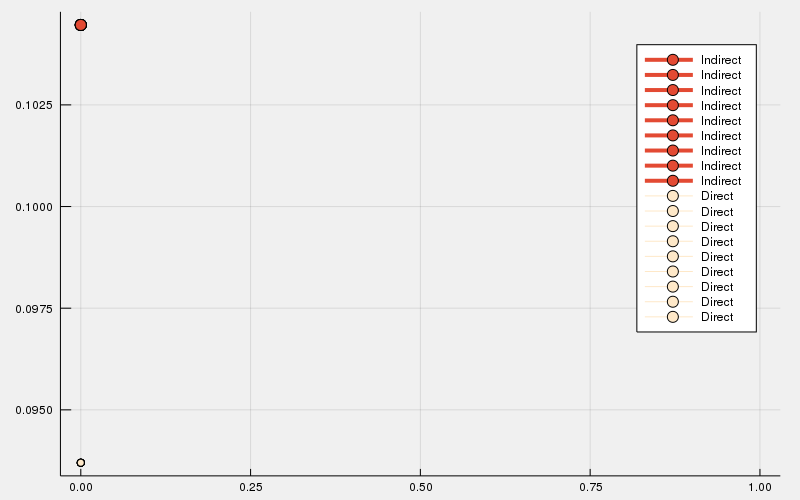

In [10]:
j = 7
clibrary(:Plots)
gr(size=(800,500), html_output_format=:png, 
    seriescolor=:magma,  background_color_legend=:white, 
    background=RGB(((240,240,240) ./ 255.)...));
plot(traj_indirect[6],traj_indirect[7][j,:],label="Indirect",seriescolor=RGB(((227,74,51) ./ 255.)...),linewidth=4,marker=6)
plot!(traj_direct[6],traj_direct[7][j,:],label="Direct",seriescolor=RGB(((254,232,200) ./ 255.)...),linewidth=0,marker=4)

In [ ]:
@benchmark Bilevel.simulate(sim_data_indirect, ctrl!, x0, N)

In [ ]:
@benchmark Bilevel.simulate(sim_data_direct, ctrl!, x0, N)

# Tuning Lower Solver

In [ ]:
# tuning the lower level solver
Δt = .01
sim_data = get_sim_data_direct(mechanism,env,Δt,relax_comp=false)
q0 = [1., 0., 0., 0., 0., 0., 0.]
v0 = [0., 0., 0., .01, .01, 0.]
u0 = zeros(6)
eval_cons = Bilevel.generate_solver_fn_sim_direct(sim_data,q0,v0,u0)

sim_data.lower_options[1]["num_fosteps"] = 1
sim_data.lower_options[1]["num_sosteps"] = 9
sim_data.lower_options[1]["c"] = 1000.
sim_data.lower_options[1]["c_fos"] = 10.
sim_data.lower_options[1]["c_sos"] = 10.

sim_data.lower_options[2]["num_fosteps"] = 1
sim_data.lower_options[2]["num_sosteps"] = 9
sim_data.lower_options[2]["c"] = 1000.
sim_data.lower_options[2]["c_fos"] = 10.
sim_data.lower_options[2]["c_sos"] = 10.

x = vcat(q0,v0)
eval_cons(x);

# using the wrong Jacobian, need a jacobian that goes from configuration to position of points

# Trajectory Optimization

In [3]:
q1 = [1., 0., 0., 0., 0., 0., 0.]
qN = [1., 0., 0., 0., .1, 0., 0.]
N = 10
Δt = .01

0.01

In [18]:
sim_data_indirect = get_trajopt_data_indirect(mechanism,env,Δt,N,relax_comp=true)

# adding user defined constraint
vs = sim_data_indirect.vs

add_eq!(sim_data_indirect, :cq1, length(q1), x -> vs(x, :q1) - q1)
add_eq!(sim_data_indirect, :cqN, length(qN), x -> vs(x, Symbol("q", N)) - qN)

add_box_con!(sim_data_indirect, :u, :u, zeros(num_velocities(mechanism)), zeros(num_velocities(mechanism)), 1:N-1)
add_box_con!(sim_data_indirect, :hbox, :h, [.015], [.02], 1:N-1)

for i=1:N
    add_ineq!(sim_data_indirect, Symbol("height",i), 1, x -> vs(x, Symbol("q",i))[7] - .001)
end

In [19]:
traj_indirect = Bilevel.trajopt(sim_data_indirect, quaternion_state=true, verbose=1)

Finished successfully: optimality conditions satisfied


(Any[[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [1.0, 1.08892e-9, -9.63035e-7, 1.0153e-9, 0.0150909, 4.34743e-12, 0.000914743], [1.0, 2.09409e-9, -1.519e-6, 1.82107e-9, 0.030415, 5.12022e-12, 0.0], [1.0, 2.48918e-9, -2.20989e-6, 2.24653e-9, 0.0465856, 9.44161e-12, 9.10588e-8], [1.0, 2.8801e-9, -2.55032e-6, 2.52811e-9, 0.0581477, 1.35695e-11, 0.0], [1.0, -1.77255e-10, -3.31827e-6, -5.04163e-10, 0.0684792, 1.08688e-11, 9.79297e-9], [1.0, -3.31829e-10, -2.64581e-6, -6.33094e-10, 0.0794968, 7.12478e-12, 1.04807e-18], [1.0, 4.18361e-10, -2.32887e-6, -4.76226e-10, 0.0877213, 4.32437e-12, 4.13121e-7], [1.0, 8.80359e-10, -1.26885e-6, -4.52491e-10, 0.0943941, 1.63842e-12, 2.42721e-7], [1.0, 0.0, 0.0, 0.0, 0.1, 0.0, 0.0]], Any[[-4.15587e-13, 0.0086858, 4.79862e-13, 0.978904, 6.04543e-10, 0.210569], [1.41242e-7, -0.000124938, 1.31694e-7, 0.978903, -1.58307e-9, 0.0593348], [1.25777e-7, -6.95718e-5, 1.00861e-7, 0.958793, -3.65898e-9, -0.0572365], [4.0812e-8, -7.13681e-5, 4.39503e-8, 0.835208, -3.52944e-9

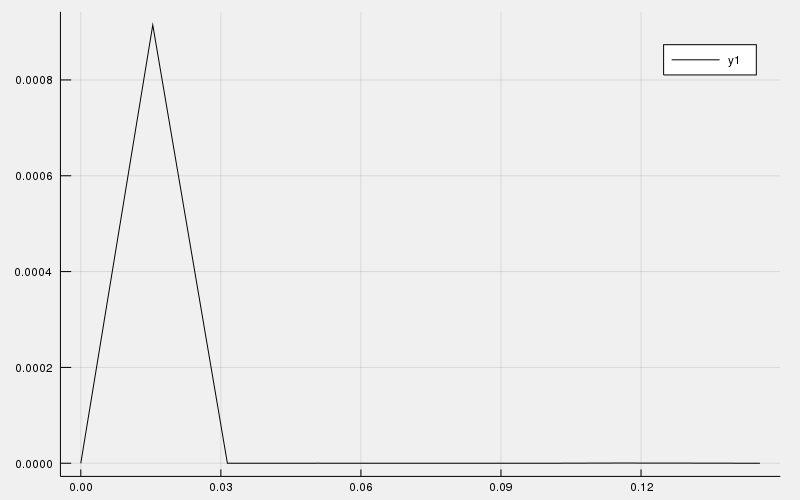

In [20]:
plot(traj_indirect[7],traj_indirect[8][7,:])

In [24]:
sim_data_direct = get_trajopt_data_direct(mechanism,env,Δt,N,relax_comp=true)

# adding user defined constraint
vs = sim_data_direct.vs

add_eq!(sim_data_direct, :cq1, length(q1), x -> vs(x, :q1) - q1)
add_eq!(sim_data_direct, :cqN, length(qN), x -> vs(x, Symbol("q", N)) - qN)

add_box_con!(sim_data_direct, :u, :u, zeros(num_velocities(mechanism)), zeros(num_velocities(mechanism)), 1:N-1)
add_box_con!(sim_data_direct, :hbox, :h, [.015], [.02], 1:N-1)

for i=1:N
    add_ineq!(sim_data_direct, Symbol("height",i), 1, x -> vs(x, Symbol("q",i))[7] - .001)
end

In [25]:
traj_direct = Bilevel.trajopt(sim_data_direct, quaternion_state=true, verbose=1)

The problem appears to be infeasible: nonlinear infeasibilities minimized


(Any[[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, -8.79044e-16], [0.999996, 1.38505e-6, -0.00208316, 7.18278e-14, 0.0152686, -6.72438e-10, 0.000561134], [0.999919, 2.32328e-6, 0.00779074, -1.30304e-8, 0.0305763, -5.19993e-9, -0.00108397], [0.999985, 2.32324e-6, 0.00564637, -1.78942e-8, 0.0424699, -9.72587e-9, 0.001], [0.999993, 2.32319e-6, 0.00359943, -2.26026e-8, 0.0543543, -1.42513e-8, 0.00175205], [0.999884, 2.32321e-6, 0.0123607, -2.31855e-9, 0.0662746, -1.87809e-8, 0.000297625], [0.999986, 2.75157e-6, 0.00580312, -2.29646e-8, 0.0764108, -2.52582e-8, 0.000146298], [0.999989, -1.32303e-6, 0.00538476, 1.9591e-10, 0.0854262, -1.37264e-8, 2.57332e-5], [0.999996, -5.51519e-7, 0.00221694, 0.0, 0.0932584, -5.63722e-9, 3.57272e-5], [0.999996, 0.0, 0.0, 0.0, 0.1, 0.0, 0.0]], Any[[0.0, -0.483422, 0.0, 1.13995, 3.68846e-7, -0.0582825], [0.000184675, -0.277755, 0.0, 1.01806, 5.25736e-8, 0.0331679], [0.00012512, 1.31663, -3.8527e-6, 1.0222, -7.47871e-7, -0.0937687], [0.0, -0.28592, 0.0, 0.790625, 6.64528e-7,

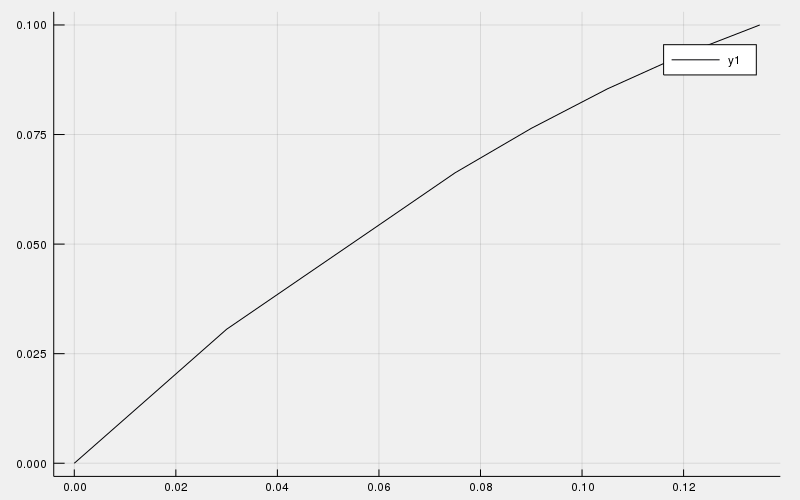

In [27]:
plot(traj_direct[7],traj_direct[8][5,:])

# Distance gradients 

In [ ]:
urdf = joinpath("..", "urdf", "panda", "panda_arm_box.urdf")
mechanism = parse_urdf(Float64, urdf)

floor = findbody(mechanism, "floor")
point = Point3D(default_frame(floor), SVector([0.,0.,0.]...))
normal = FreeVector3D(default_frame(floor), SVector([0.,0.,1.]...))
floor_obs = Obstacle(floor, point, normal, :xyz, .5)

obstacles = [floor_obs]
env = Environment(mechanism, urdf, obstacles)
ctrl! = (u,t,x) -> u[:] .= 0.
x0 = MechanismState(mechanism)

In [ ]:
Δt = .01
sim_data_direct = get_sim_data_direct(mechanism,env,Δt,relax_comp=false)

In [ ]:
envj = sim_data_direct.envj_cache[Float64]

In [ ]:
mvis = MechanismVisualizer(mechanism, URDFVisuals(urdf));
gr(size=(800,500))

In [ ]:
open(mvis)

In [ ]:
widget = manipulate!(mvis)

In [ ]:
setelement!(mvis, envj.contact_jacobians[5].contact.point, .03, "end_effector_contact")

In [ ]:
# q1 = [1., 0., 0., 0., 2., 1., 1.]
# q1 = configuration(mvis)
q1 = rand(num_positions(mechanism))
v1 = zeros(num_velocities(mechanism))

set_configuration!(x0, q1)
set_velocity!(x0, v1)
normalize_configuration!(x0)
Bilevel.contact_jacobian!(envj, x0)

# println(envj.contact_jacobians[5].N)

In [ ]:
envj.contact_jacobians[5].contact

In [ ]:
configuration(x0)

In [ ]:
widget = manipulate!(mvis)